# Top-30 storms by exceedance metrics: historical vs future

Analysis can be restricted to storms whose **first tracking point is north of
a given latitude**. The aim is to remove low-latitude systems (subtropical / 
tropical-origin storms) from the population so that the comparison focuses 
on genuinely extratropical cyclones in their mid- and high-latitude formation zone.

For each GCM-driven simulation pair (historical 1980-2014 vs future 2063-2097), we
isolate the most extreme extratropical cyclones and compare the two periods along
three axes of storm severity:

- **Occurrence** ($T_{ETC}$): number of grid-point-hours where the storm exceeds a
  given land-only reference percentile of precipitation or wind
- **Intensity** ($\overline{EE_V}$): mean excess above that percentile, averaged over
  all exceeding grid-point-hours
- **Cumulative excess** ($EE_{V,cum|ETC} = \overline{EE_V} \cdot T_{ETC}$): total amount
  by which the storm exceeds the reference, combining extent and intensity

Two percentiles are examined (99th, 99.9th) and two variables (precipitation, 10 m
wind speed). Each figure is a 2x3 grid: rows are percentiles, columns are GCM
pairs. Storms are selected two different ways — by cumulative excess (favouring
long-lived / widespread storms) and by regularized intensity (favouring the most
violent storms per grid-point-hour). The statistical summary table at the end
reports Mann-Whitney U and Kolmogorov-Smirnov tests for the *full* (filtered)
storm sample.

In [1]:
import pandas as pd
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import cartopy
import cartopy.crs as ccrs
from matplotlib.patches import Ellipse
from matplotlib.lines import Line2D
from scipy import stats

plt.rcParams.update({
    'font.family': 'serif',
    'font.size': 14,
    'axes.spines.top': False,
    'axes.spines.right': False,
    'axes.linewidth': 0.8,
    'axes.grid': False,
})

In [2]:
import sys
sys.path.append('/home/vdemeyer/TRACKING/KATJA/POSTPROCESSING')
from ETC_tools import open_df

base = '/home/vdemeyer/projects/rrg-gachon/vdemeyer'
pairs = [('UBD', 'UBG'), ('UBE', 'UBH'), ('UBF', 'UBI')]

# Suffix of the aggregate pickle (must match aggregate_storm_percentile_metrics.ipynb)
mask = 'urban'
mtag = 'urbanonly' if mask == 'urban' else 'land_only'
wetdays = False
future = False
add_file = ''
if wetdays:
    add_file += '_wetdays'
# `_future_percentile` is appended per-sim below (only for future sims)

N_TOP = 30
# Percentile keys: integer tag used in labels / columns, and the matching float
# value stored in the `quantile` column of the new aggregate pickle.
PERCENTILES = [99, 999]
PCT_LABEL = {99: '99th', 999: '99.9th'}
PCT_QUANTILE = {99: 99.0, 999: 99.9}

# Geographical filter: keep only storms whose first tracking point is north of LAT_MIN.
LAT_MIN = 0.

sim_label = {
    'ERA5': r'ERA5',
    'UBB': r'CRCM6$_{\mathbf{ERA5}}$',
    'UBD': r'CRCM6$_{\mathbf{EC\text{-}Earth3\text{-}Veg}}$',
    'UBG': r'CRCM6$_{\mathbf{EC\text{-}Earth3\text{-}Veg}}$',
    'UBE': r'CRCM6$_{\mathbf{MPI\text{-}ESM1\text{-}2\text{-}HR}}$',
    'UBH': r'CRCM6$_{\mathbf{MPI\text{-}ESM1\text{-}2\text{-}HR}}$',
    'UBF': r'CRCM6$_{\mathbf{MIROC6}}$',
    'UBI': r'CRCM6$_{\mathbf{MIROC6}}$',
}

# Plain-text names (for tables)
sim_name = {
    'ERA5': 'ERA5',
    'UBB': 'CRCM6 (ERA5)',
    'UBD': 'CRCM6 (EC-Earth3-Veg)',
    'UBG': 'CRCM6 (EC-Earth3-Veg)',
    'UBE': 'CRCM6 (MPI-ESM1-2-HR)',
    'UBH': 'CRCM6 (MPI-ESM1-2-HR)',
    'UBF': 'CRCM6 (MIROC6)',
    'UBI': 'CRCM6 (MIROC6)',
}

C_HIST = '#2166ac'   # dark blue
C_FUT  = '#b2182b'   # dark red
C_HIST_LIGHT = '#92c5de'
C_FUT_LIGHT  = '#f4a582'

# Season -> marker (used by scatter plots) and -> color (used by trajectory plots)
SEASON_MARKER = {'DJF': 'o', 'MAM': 's', 'JJA': '^', 'SON': 'D'}
SEASON_LABEL = {'DJF': 'DJF', 'MAM': 'MAM', 'JJA': 'JJA', 'SON': 'SON'}
SEASON_COLOR = {'DJF': '#7c4fa0', 'MAM': '#2ca02c', 'JJA': '#ffd92f', 'SON': '#c97f23'}


def month_to_season(m):
    if m in (12, 1, 2): return 'DJF'
    if m in (3, 4, 5): return 'MAM'
    if m in (6, 7, 8): return 'JJA'
    return 'SON'


FUTURE_SIMS = {'UBG', 'UBH', 'UBI'}

def _sim_period(sim):
    return (2063, 2097) if sim in FUTURE_SIMS else (1980, 2014)


tracks_cache = {}  # sim -> full track DataFrame (from open_df), populated on first access


def load_tracks(sim):
    """Read (and cache) the full tracking DataFrame for one simulation via ETC_tools.open_df.

    Columns: storm, point, i, j, date, lat, lon, pressure. period_filtering=False keeps
    every tracked storm; the per-period restriction is handled upstream by the aggregate
    pickle's initiation-date filter."""
    if sim not in tracks_cache:
        tracks_cache[sim] = open_df(sim, period_filtering=False)
    return tracks_cache[sim]


def first_point_lat(sim):
    """Return a Series indexed by storm id with the latitude of the first tracking point."""
    df_t = load_tracks(sim)
    return df_t.sort_values(['storm', 'point']).groupby('storm')['lat'].first()


# New aggregate pickle: one file per simulation containing both 99th and 99.9th
# percentiles, distinguished by the `quantile` column (values 99.0 and 99.9).
# We split it into data_pct[99] / data_pct[999] for downstream code.
data_pct = {pct: {} for pct in PERCENTILES}
first_lat_cache = {}  # sim -> Series, populated only if LAT_MIN > 0

apply_lat_filter = LAT_MIN > 0

for sim in {s for pair in pairs for s in pair}:
    start_year, end_year = _sim_period(sim)
    suffix = add_file + ('_future_percentile' if (future and sim in FUTURE_SIMS) else '')
    pkl = f'{base}/{sim}/STORM_RELATED/STORM_METRICS/storm_exceed_metrics_{mtag}_{sim}_{start_year}-{end_year}{suffix}.pkl'
    df_full = pd.read_pickle(pkl)
    df_full['season'] = df_full['initiation_date'].dt.month.map(month_to_season)

    for pct in PERCENTILES:
        df = df_full[df_full['quantile'] == PCT_QUANTILE[pct]].copy()
        n_before = len(df)

        if apply_lat_filter:
            if sim not in first_lat_cache:
                first_lat_cache[sim] = first_point_lat(sim)
            init_lat = df['storm_id'].map(first_lat_cache[sim])
            mask = init_lat > LAT_MIN
            df = df[mask].copy()
            df['init_lat'] = init_lat[mask].values
            print(f"[{PCT_LABEL[pct]}] {sim}: {len(df)}/{n_before} storms kept "
                  f"(first-point lat > {LAT_MIN}°N)")
        else:
            print(f"[{PCT_LABEL[pct]}] {sim}: {n_before} storms (no latitude filter)")

        data_pct[pct][sim] = df

# Default dict used by the summary-statistics table (99.9th percentile)
data = data_pct[999]


def confidence_ellipse(x, y, ax, n_std=2.146, **kwargs):
    """Draw a covariance-based confidence ellipse (default 90%)."""
    if len(x) < 3:
        return
    cov = np.cov(x, y)
    eigvals, eigvecs = np.linalg.eigh(cov)
    order = eigvals.argsort()[::-1]
    eigvals, eigvecs = eigvals[order], eigvecs[:, order]
    angle = np.degrees(np.arctan2(*eigvecs[:, 0][::-1]))
    width, height = 2 * n_std * np.sqrt(eigvals)
    ellipse = Ellipse(xy=(np.mean(x), np.mean(y)), width=width, height=height,
                       angle=angle, **kwargs)
    ax.add_patch(ellipse)


def format_pval(p):
    if p < 0.001:  return "p < 0.001"
    elif p < 0.01: return f"p = {p:.3f}"
    elif p < 0.05: return f"p = {p:.3f}"
    else:           return f"p = {p:.2f}"


def significance_stars(p):
    if p < 0.001: return '***'
    elif p < 0.01: return '**'
    elif p < 0.05: return '*'
    else: return 'n.s.'

[99th] UBG: 8566 storms (no latitude filter)
[99.9th] UBG: 8566 storms (no latitude filter)
[99th] UBI: 9736 storms (no latitude filter)
[99.9th] UBI: 9736 storms (no latitude filter)
[99th] UBE: 9100 storms (no latitude filter)
[99.9th] UBE: 9100 storms (no latitude filter)
[99th] UBD: 9420 storms (no latitude filter)
[99.9th] UBD: 9420 storms (no latitude filter)
[99th] UBH: 8941 storms (no latitude filter)
[99.9th] UBH: 8941 storms (no latitude filter)
[99th] UBF: 10151 storms (no latitude filter)
[99.9th] UBF: 10151 storms (no latitude filter)


## Selection by cumulative excess

The first set of figures selects, in each panel, the **top-N storms by cumulative
excess** $EE_{V,cum|ETC}$. This favours storms that are both intense *and*
spatially/temporally extended. For each panel we plot raw occurrence $T_{ETC}$
against raw mean excess intensity $\overline{EE_V}$; dashed ellipses show the 90%
covariance-based confidence region. Marker shape encodes initiation season.

A Mann-Whitney U test (two-sided) is reported for each of the three metrics
within each panel; significance is shown next to the legend.

### Precipitation

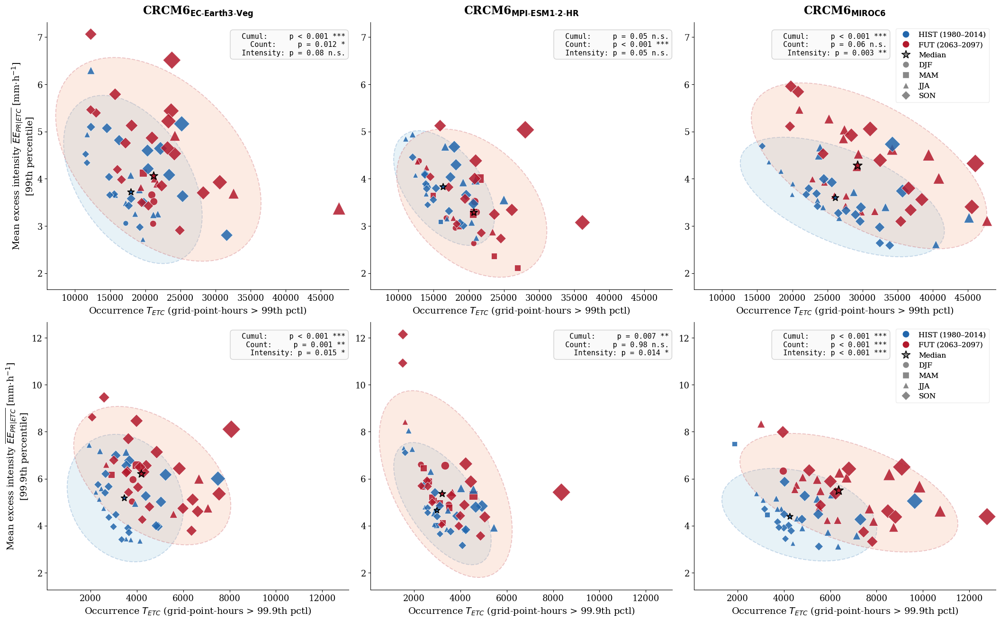

In [3]:
LAMBDA = 10000  # default regularization for intensity-based selection: I_reg = mean_excess * n / (n + LAMBDA)

def _resolve_lambda(lambda_, pct):
    """Allow lambda_ to be a scalar or a dict {percentile_tag: lam}."""
    if isinstance(lambda_, dict):
        return lambda_[pct]
    return lambda_

def add_regularized_intensity(df, metric_var, lam):
    """Return a copy of df with an ireg_{var}_lam{lam} column."""
    cnt = df[f'count_exceed_{metric_var}'].astype(float).values
    inten = df[f'mean_excess_{metric_var}'].astype(float).values
    out = df.copy()
    if lam == 0:
        out[f'ireg_{metric_var}_lam{lam}'] = np.where(cnt > 0, inten, np.nan)
    else:
        out[f'ireg_{metric_var}_lam{lam}'] = inten * (cnt / (cnt + lam))
    return out

def _ellipse_bbox(x, y, n_std=2.146):
    """Bounding box (xmin, xmax, ymin, ymax) of the rotated 90% confidence ellipse."""
    if len(x) < 3:
        return (np.nan, np.nan, np.nan, np.nan)
    cov = np.cov(x, y)
    eigvals, eigvecs = np.linalg.eigh(cov)
    order = eigvals.argsort()[::-1]
    eigvals, eigvecs = eigvals[order], eigvecs[:, order]
    angle = np.arctan2(*eigvecs[:, 0][::-1])
    w, h = 2 * n_std * np.sqrt(eigvals)
    mx, my = np.mean(x), np.mean(y)
    ex = 0.5 * np.sqrt((w * np.cos(angle)) ** 2 + (h * np.sin(angle)) ** 2)
    ey = 0.5 * np.sqrt((w * np.sin(angle)) ** 2 + (h * np.cos(angle)) ** 2)
    return (mx - ex, mx + ex, my - ey, my + ey)


def plot_top_scatter(metric_var, units, select_by='cum', variable_marker_size=True,
                      lambda_=LAMBDA, top_storms=N_TOP):
    """Scatter (count, intensity) for top-N storms, 2 rows (99th, 99.9th) x 3 cols (pairs).

    Parameters
    ----------
    metric_var : {'pr', 'wind'}
    units : str
        Units of mean excess intensity (e.g. 'mm/h' or 'm/s'), shown in axis labels.
    select_by : {'cum', 'intensity'}
        'cum'       -> top-N by cumulative excess EE_{V,cum|ETC}
        'intensity' -> top-N by regularized intensity I_reg = mean_excess * n / (n + lam)
        Axes always display raw count and raw mean_excess.
    variable_marker_size : bool
        If True, marker area scales with cumulative excess EE_{V,cum|ETC}.
    lambda_ : float
        Regularization strength for I_reg (only used when select_by='intensity').
    top_storms : int
        Number of storms kept per (simulation, percentile) panel.

    Within each row (one percentile), all three panel columns share the same x- and y-limits
    so the three GCM pairs can be compared at a glance. Limits include the full 90% ellipse,
    which means x can go slightly negative.

    The legend is drawn only in the right-most column of each row (one legend per percentile)
    to avoid repeating it six times across the figure.
    """
    cum_col = f'cum_excess_{metric_var}'
    cnt_col = f'count_exceed_{metric_var}'
    int_col = f'mean_excess_{metric_var}'
    var_math = 'PR' if metric_var == 'pr' else 'WS'

    # First pass: compute per-panel selection and the row-level shared limits
    selections = {}                       # (row, col) -> (df_hist_top, df_fut_top)
    row_x = {r: [np.inf, -np.inf] for r in range(len(PERCENTILES))}
    row_y = {r: [np.inf, -np.inf] for r in range(len(PERCENTILES))}

    for row, pct in enumerate(PERCENTILES):
        for col, (hist, fut) in enumerate(pairs):
            df_h_all = data_pct[pct][hist]
            df_f_all = data_pct[pct][fut]
            if select_by == 'intensity':
                lam = _resolve_lambda(lambda_, pct)
                df_h_all = add_regularized_intensity(df_h_all, metric_var, lam)
                df_f_all = add_regularized_intensity(df_f_all, metric_var, lam)
                sel_col = f'ireg_{metric_var}_lam{lam}'
            else:
                sel_col = cum_col
            df_hist = df_h_all.nlargest(top_storms, sel_col)
            df_fut = df_f_all.nlargest(top_storms, sel_col)
            selections[(row, col)] = (df_hist, df_fut)

            xh = df_hist[cnt_col].values.astype(float)
            yh = df_hist[int_col].values.astype(float)
            xf = df_fut[cnt_col].values.astype(float)
            yf = df_fut[int_col].values.astype(float)

            xs = np.concatenate([xh, xf])
            ys = np.concatenate([yh, yf])
            row_x[row][0] = min(row_x[row][0], np.nanmin(xs))
            row_x[row][1] = max(row_x[row][1], np.nanmax(xs))
            row_y[row][0] = min(row_y[row][0], np.nanmin(ys))
            row_y[row][1] = max(row_y[row][1], np.nanmax(ys))

            # Extend by the bounding boxes of the two 90% ellipses so nothing gets clipped
            for xx, yy in ((xh, yh), (xf, yf)):
                emin_x, emax_x, emin_y, emax_y = _ellipse_bbox(xx, yy)
                if np.isfinite(emin_x):
                    row_x[row][0] = min(row_x[row][0], emin_x)
                    row_x[row][1] = max(row_x[row][1], emax_x)
                    row_y[row][0] = min(row_y[row][0], emin_y)
                    row_y[row][1] = max(row_y[row][1], emax_y)

    fig, axes = plt.subplots(2, 3, figsize=(21, 13), constrained_layout=True)

    for row, pct in enumerate(PERCENTILES):
        x_pad = 0.03 * (row_x[row][1] - row_x[row][0])
        y_pad = 0.05 * (row_y[row][1] - row_y[row][0])

        for col, (hist, fut) in enumerate(pairs):
            ax = axes[row, col]
            df_hist, df_fut = selections[(row, col)]

            xh, yh = df_hist[cnt_col].values.astype(float), df_hist[int_col].values
            xf, yf = df_fut[cnt_col].values.astype(float), df_fut[int_col].values

            confidence_ellipse(xh, yh, ax, n_std=2.146, facecolor=C_HIST_LIGHT, alpha=0.22,
                               edgecolor=C_HIST, linewidth=1.4, linestyle='--')
            confidence_ellipse(xf, yf, ax, n_std=2.146, facecolor=C_FUT_LIGHT, alpha=0.22,
                               edgecolor=C_FUT, linewidth=1.4, linestyle='--')

            cum_h = df_hist[cum_col].values
            cum_f = df_fut[cum_col].values
            if variable_marker_size:
                cum_all = np.concatenate([cum_h, cum_f])
                cmin, cmax = cum_all.min(), cum_all.max()
                size_of = lambda c: 60 + 320 * (c - cmin) / (cmax - cmin + 1e-9)
            else:
                size_of = lambda c: np.full_like(c, 130, dtype=float)

            for season, marker in SEASON_MARKER.items():
                mh = df_hist['season'].values == season
                mf = df_fut['season'].values == season
                if mh.any():
                    ax.scatter(xh[mh], yh[mh], s=size_of(cum_h[mh]), color=C_HIST,
                               marker=marker, edgecolors='white', linewidths=0.6,
                               alpha=0.85, zorder=3)
                if mf.any():
                    ax.scatter(xf[mf], yf[mf], s=size_of(cum_f[mf]), color=C_FUT,
                               marker=marker, edgecolors='white', linewidths=0.6,
                               alpha=0.85, zorder=3)

            mxh, myh = np.median(xh), np.median(yh)
            mxf, myf = np.median(xf), np.median(yf)
            if variable_marker_size:
                s_h = float(size_of(np.array([mxh * myh]))[0])
                s_f = float(size_of(np.array([mxf * myf]))[0])
            else:
                s_h = s_f = 260
            ax.scatter(mxh, myh, s=s_h, color=C_HIST,
                       edgecolors='k', linewidths=1.4, marker='*', zorder=6)
            ax.scatter(mxf, myf, s=s_f, color=C_FUT,
                       edgecolors='k', linewidths=1.4, marker='*', zorder=6)

            _, p_cum = stats.mannwhitneyu(df_hist[cum_col], df_fut[cum_col], alternative='two-sided')
            _, p_cnt = stats.mannwhitneyu(df_hist[cnt_col], df_fut[cnt_col], alternative='two-sided')
            _, p_int = stats.mannwhitneyu(df_hist[int_col], df_fut[int_col], alternative='two-sided')
            # _, p_cum = stats.ks_2samp(df_hist[cum_col], df_fut[cum_col])
            # _, p_cnt = stats.ks_2samp(df_hist[cnt_col], df_fut[cnt_col])
            # _, p_int = stats.ks_2samp(df_hist[int_col], df_fut[int_col])

            # Legend only in the right-most column (one per row / percentile)
            if col == len(pairs) - 1:
                legend_handles = [
                    Line2D([0], [0], marker='o', color='w', markerfacecolor=C_HIST,
                           markeredgecolor='white', markersize=11, label='HIST (1980–2014)'),
                    Line2D([0], [0], marker='o', color='w', markerfacecolor=C_FUT,
                           markeredgecolor='white', markersize=11, label='FUT (2063–2097)'),
                    Line2D([0], [0], marker='*', color='w', markerfacecolor='#888',
                           markeredgecolor='k', markersize=13, label='Median'),
                ]
                for season, marker in SEASON_MARKER.items():
                    legend_handles.append(
                        Line2D([0], [0], marker=marker, color='w', markerfacecolor='#888',
                               markeredgecolor='white', markersize=10, label=season)
                    )
                leg = ax.legend(handles=legend_handles, fontsize=11, loc='upper right',
                                framealpha=0.2, edgecolor='#cccccc', ncol=1,
                                bbox_to_anchor=(0.99, 0.99))
                ax.add_artist(leg)

            textstr = (f'  Cumul:     {format_pval(p_cum)} {significance_stars(p_cum)}\n'
                       f'  Count:     {format_pval(p_cnt)} {significance_stars(p_cnt)}\n'
                       f'  Intensity: {format_pval(p_int)} {significance_stars(p_int)}')
            # Last column: stats stays at its current mid-right position to avoid the
            # legend that occupies the upper-right corner. Other columns: push it to
            # the upper right so all panels in a row anchor it visually the same way.
            stats_x = 0.64 if col == len(pairs) - 1 else 0.99
            ax.text(stats_x, 0.96, textstr, transform=ax.transAxes, fontsize=11,
                    verticalalignment='top', horizontalalignment='right',
                    fontfamily='monospace',
                    bbox=dict(boxstyle='round,pad=0.4', facecolor='#fafafa',
                              edgecolor='#cccccc', alpha=0.9))

            ax.tick_params(axis='both', labelsize=13)
            ax.set_xlabel(rf'Occurrence $T_{{ETC}}$ (grid-point-hours > {PCT_LABEL[pct]} pctl)', fontsize=14)
            if col == 0:
                ax.set_ylabel(rf'Mean excess intensity $\overline{{EE_{{{var_math}|ETC}}}}$ [{units}]' + '\n'
                              f'[{PCT_LABEL[pct]} percentile]', fontsize=14)
            if row == 0:
                ax.set_title(sim_label[hist], fontsize=17, fontweight='bold', pad=12)

            # Shared limits per row, with ellipse-aware padding (x may be slightly negative)
            ax.set_xlim(row_x[row][0] - x_pad, row_x[row][1] + x_pad)
            ax.set_ylim(row_y[row][0] - y_pad, row_y[row][1] + y_pad)

    var_text = 'precipitation' if metric_var == 'pr' else 'wind'
    size_text = (rf'$\it{{marker\ size\ \propto\ EE_{{{var_math},cum|ETC}};\ ellipse\ =\ 90\%\ confidence}}$'
                 if variable_marker_size
                 else r'$\it{ellipse\ =\ 90\%\ confidence}$')
    if select_by == 'cum':
        sel_title = rf'Top {top_storms} storms by cumulative excess $EE_{{{var_math},cum|ETC}}$'
    else:
        if isinstance(lambda_, dict):
            lam_txt = ', '.join(f'{PCT_LABEL[p]}: {lambda_[p]}' for p in PERCENTILES)
        else:
            lam_txt = str(lambda_)
        sel_title = (rf'Top {top_storms} storms by regularized intensity '
                     rf'$\overline{{EE_{{{var_math}|ETC}}}} \cdot T_{{ETC}}/(T_{{ETC}}+\lambda)$  '
                     rf'($\lambda$ = {lam_txt})')
    # fig.suptitle(sel_title + '\n' + size_text, fontsize=14, y=1.05)
    return fig


fig = plot_top_scatter('pr', 'mm·h$^{-1}$', select_by='cum', variable_marker_size=True)
plt.show()
fig.savefig(f'{base}/ALL/PLOT/scatter_top{N_TOP}_storms_cumul_PR.png', dpi=200, bbox_inches='tight')

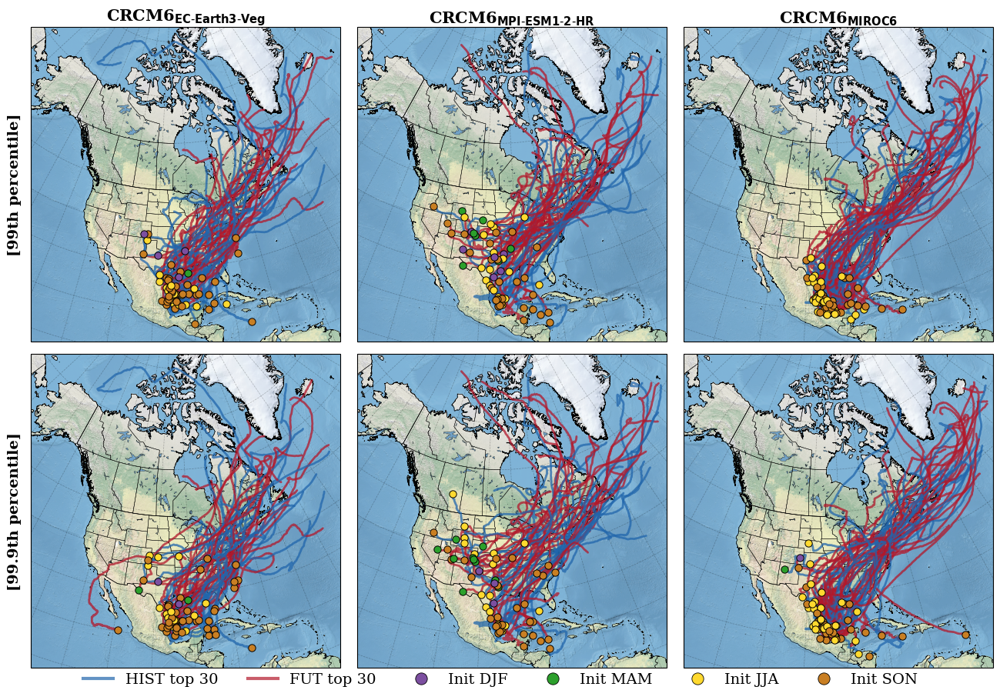

In [4]:
import random
def plot_top_trajectories(metric_var, units, select_by='cum',
                            lambda_=LAMBDA, top_storms=N_TOP):
    """Map the trajectories of the same top-N storms shown in the scatter above.

    2 rows (99th, 99.9th percentile) x 3 cols (GCM pairs). In each panel:
      - HIST top-N tracks drawn in C_HIST (blue), FUT in C_FUT (red), with a
        thick translucent line and no per-point markers.
      - The first tracking point is marked with a filled circle whose color
        encodes the initiation season (SEASON_COLOR).
    Selection (`select_by`, `lambda_`) and `top_storms` follow the same convention
    as plot_top_scatter, so the trajectories shown here correspond exactly to the
    storms in the scatter panel directly above.

    Base-map style (Lambert Conformal, NE1 background, lakes, borders, gridlines)
    follows the project's standard cartopy template.
    """
    plotcrs = ccrs.LambertConformal(central_latitude=45, central_longitude=-95)
    fig, axes = plt.subplots(2, 3, subplot_kw={'projection': plotcrs},
                              figsize=(12.8, 9), constrained_layout=True,
                              gridspec_kw={'hspace': 0, 'wspace': 0.05})
    # Tighten the constrained-layout pads so panels and the outside legend sit
    # close together (the suptitle is now commented, so the previous 0.14 pad
    # is no longer needed at the top).
    try:
        fig.get_layout_engine().set(h_pad=0.0, w_pad=0.0, hspace=0.0, wspace=0.0)
    except Exception:
        pass

    # Map assets are constructed once and reused across panels
    borders = cartopy.feature.NaturalEarthFeature(
        category='cultural', name='admin_0_boundary_lines_land', scale='50m', facecolor='none')
    states_provinces = cartopy.feature.NaturalEarthFeature(
        category='cultural', name='admin_1_states_provinces', scale='50m', facecolor='none')
    lakes = cartopy.feature.NaturalEarthFeature(
        category='physical', name='lakes', scale='50m', facecolor='#72a2c7')
    img = plt.imread('/home/vdemeyer/TOOLS/NE1_50M_SR_W.tif')

    for row, pct in enumerate(PERCENTILES):
        for col, (hist, fut) in enumerate(pairs):
            ax = axes[row, col]
            ax.set_extent([-128, -56, 81, 12], crs=ccrs.PlateCarree())
            ax.imshow(img, origin='upper', extent=(-180, 180, -90, 90),
                      transform=ccrs.PlateCarree())
            ax.add_feature(borders, linewidth=0.5, edgecolor='black', zorder=2)
            ax.add_feature(states_provinces, edgecolor='black', linewidth=0.3)
            ax.add_feature(lakes, zorder=1, linewidth=0.2, edgecolor='black')
            ax.coastlines(resolution='10m', linewidth=0.4, color='black')
            ax.gridlines(linewidth=0.5, linestyle='--', color='k', alpha=0.25,
                         xlocs=range(-180, 180, 10), ylocs=range(-90, 90, 10))

            lam = _resolve_lambda(lambda_, pct)
            n_drawn = {hist: 0, fut: 0}
            
            # 1) Collecter traits + marqueurs sans dessiner
            track_items = []   # (lons, lats, color)
            marker_items = []  # (lon0, lat0, color)
            for sim, line_color in ((hist, C_HIST), (fut, C_FUT)):
                df = data_pct[pct][sim]
                if select_by == 'intensity':
                    df = add_regularized_intensity(df, metric_var, lam)
                    sel_col = f'ireg_{metric_var}_lam{lam}'
                else:
                    sel_col = f'cum_excess_{metric_var}'
                top = df.nlargest(top_storms, sel_col)
                top_ids = top['storm_id'].tolist()
                season_by_id = dict(zip(top['storm_id'], top['season']))
            
                tracks = load_tracks(sim)
                tr = tracks[tracks['storm'].isin(top_ids)].sort_values(['storm', 'point'])
                for sid, g in tr.groupby('storm'):
                    track_items.append((g['lon'].values, g['lat'].values, line_color))
                    marker_items.append((g['lon'].iloc[0], g['lat'].iloc[0],
                                         SEASON_COLOR.get(season_by_id.get(sid), '#888888')))
                    n_drawn[sim] += 1
            
            # 2) Mélange reproductible (seed dépend du panneau pour diversité entre panneaux)
            rng = random.Random(1000 * row + col)
            rng.shuffle(track_items)
            
            # 3) Tracer les lignes dans l'ordre mélangé
            for lons, lats, c in track_items:
                ax.plot(lons, lats, color=c, lw=2, alpha=0.75,
                        solid_capstyle='round', solid_joinstyle='round',
                        transform=ccrs.Geodetic(), zorder=3)
            
            # 4) Marqueurs de point initial au-dessus de tous les traits
            for lon0, lat0, mc in marker_items:
                ax.scatter(lon0, lat0, color=mc, s=45,
                           edgecolors='black', linewidths=0.7,
                           transform=ccrs.PlateCarree(), zorder=5)
            if row == 0:
                ax.set_title(sim_label[hist], fontsize=15, fontweight='bold', pad=4)
            if col == 0:
                ax.text(-0.03, 0.5, f'[{PCT_LABEL[pct]} percentile]',
                         fontsize=14, fontweight='bold',
                         transform=ax.transAxes, rotation=90, va='center', ha='right')

    # Single horizontal legend below row 2 (outside the panels). Using
    # `outside lower center` lets constrained_layout reserve the bottom space,
    # so the panel arrangement is identical to the original.
    handles = [
        Line2D([0], [0], color=C_HIST, linewidth=3, alpha=0.7,
                label=f'HIST top {top_storms}'),
        Line2D([0], [0], color=C_FUT, linewidth=3, alpha=0.7,
                label=f'FUT top {top_storms}'),
    ]
    for season in ('DJF', 'MAM', 'JJA', 'SON'):
        handles.append(Line2D([0], [0], marker='o', color='w',
                                markerfacecolor=SEASON_COLOR[season],
                                markeredgecolor='black', markeredgewidth=0.6,
                                markersize=11, label=f'Init {season}'))
    fig.legend(handles=handles, loc='outside lower center', ncol=6,
                fontsize=14, frameon=False)

    var_text = 'precipitation' if metric_var == 'pr' else 'wind'
    var_math = 'PR' if metric_var == 'pr' else 'WS'
    if select_by == 'cum':
        sel_title = rf'Top {top_storms} storms by cumulative excess $EE_{{{var_math},cum|ETC}}$'
    else:
        if isinstance(lambda_, dict):
            lam_txt = ', '.join(f'{PCT_LABEL[p]}: {lambda_[p]}' for p in PERCENTILES)
        else:
            lam_txt = str(lambda_)
        sel_title = (rf'Top {top_storms} storms by regularized intensity '
                     rf'$\overline{{EE_{{{var_math}|ETC}}}} \cdot T_{{ETC}}/(T_{{ETC}}+\lambda)$  '
                     rf'($\lambda$ = {lam_txt})')
    # fig.suptitle(f'Trajectories — {var_text}\n' + sel_title, fontsize=14)
    return fig


fig = plot_top_trajectories('pr', 'mm/h', select_by='cum')
plt.show()
fig.savefig(f'{base}/ALL/PLOT/supp_tracks_top{N_TOP}_storms_cumul_PR.png', dpi=200, bbox_inches='tight')

### Wind

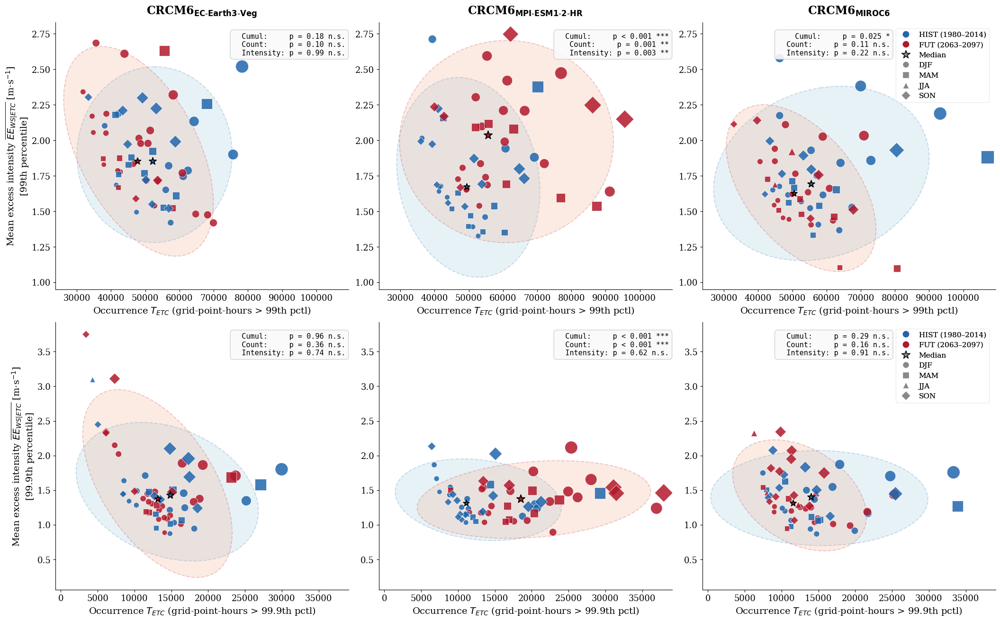

In [5]:
fig = plot_top_scatter('wind', 'm·s$^{-1}$', select_by='cum', variable_marker_size=True)
plt.show()
fig.savefig(f'{base}/ALL/PLOT/scatter_top{N_TOP}_storms_cumul_WS.png', dpi=200, bbox_inches='tight')

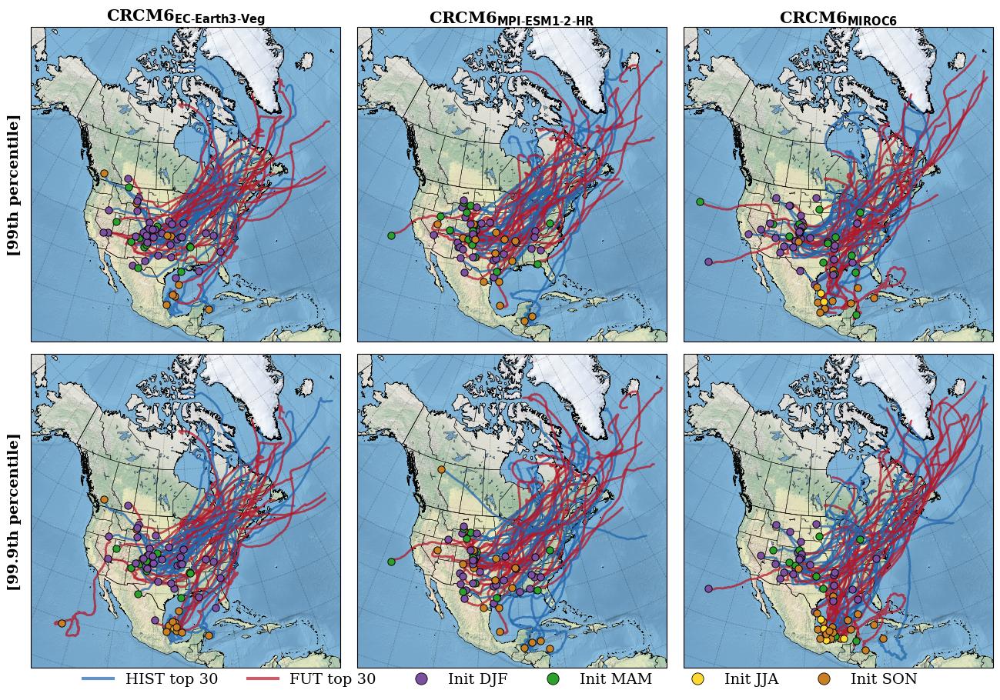

In [6]:
fig = plot_top_trajectories('wind', 'm·s$^{-1}$', select_by='cum')
plt.show()
fig.savefig(f'{base}/ALL/PLOT/supp_tracks_top{N_TOP}_storms_cumul_WS.png', dpi=200, bbox_inches='tight')

## Selection by regularized mean excess intensity

The second set of figures selects the **top-N storms by regularized intensity**

$$I_{reg} = \overline{EE_V} \cdot \frac{T_{ETC}}{T_{ETC}+\lambda}, \qquad \lambda = 10\,000$$

The $\lambda$ factor down-weights storms whose high mean intensity is supported by
very few exceeding grid-point-hours (small $T_{ETC}$), while leaving storms with
large $T_{ETC}$ essentially untouched. This isolates the most *violent* storms per
grid-point-hour independently of their spatial/temporal extent — a different view
from the cumulative-excess selection above, which is biased towards long-lived /
widespread systems.

**The axes still show the raw $T_{ETC}$ and $\overline{EE_V}$** (not the regularized
metric), and marker size still scales with cumulative excess, so the two
selections can be compared panel-by-panel.

### Precipitation

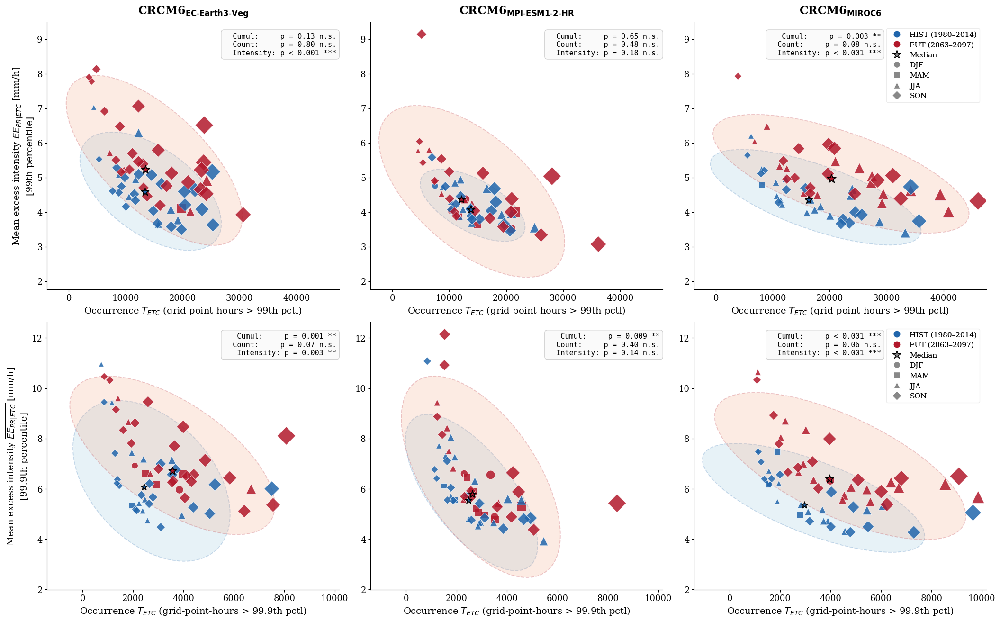

In [7]:
fig = plot_top_scatter('pr', 'mm/h', select_by='intensity', variable_marker_size=True, lambda_={99: 5000, 999: 1250})
plt.show()
# fig.savefig(f'{base}/ALL/PLOT/scatter_top{N_TOP}_storms_intensity_PR.png', dpi=200, bbox_inches='tight')

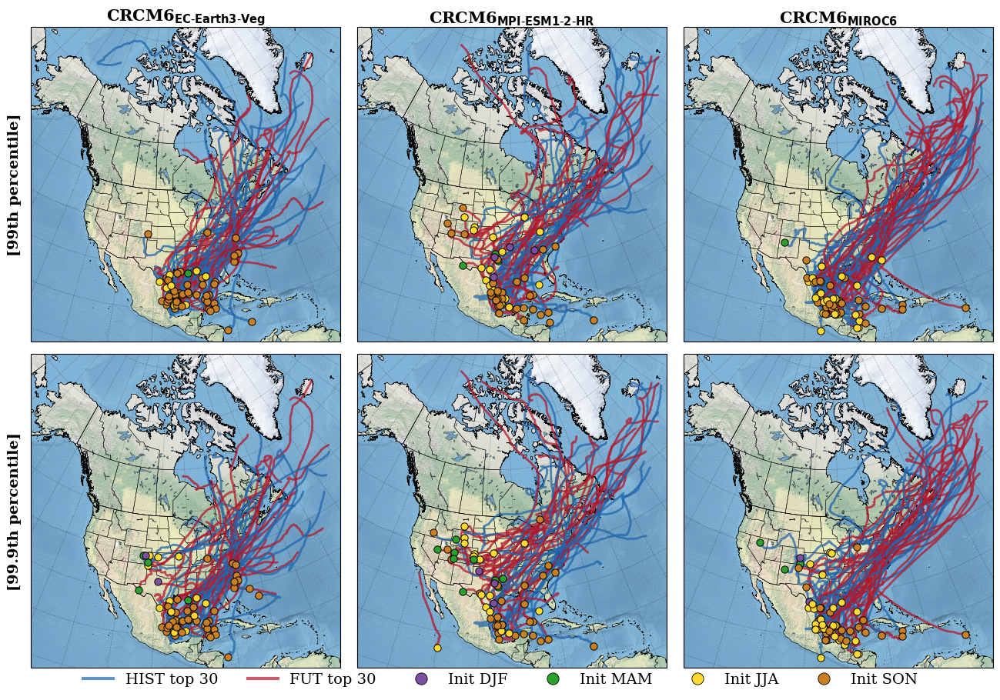

In [8]:
fig = plot_top_trajectories('pr', 'mm/h', select_by='intensity', lambda_={99: 5000, 999: 1250})
plt.show()
fig.savefig(f'{base}/ALL/PLOT/supp_tracks_top{N_TOP}_storms_intensity_PR.png', dpi=200, bbox_inches='tight')

### Wind

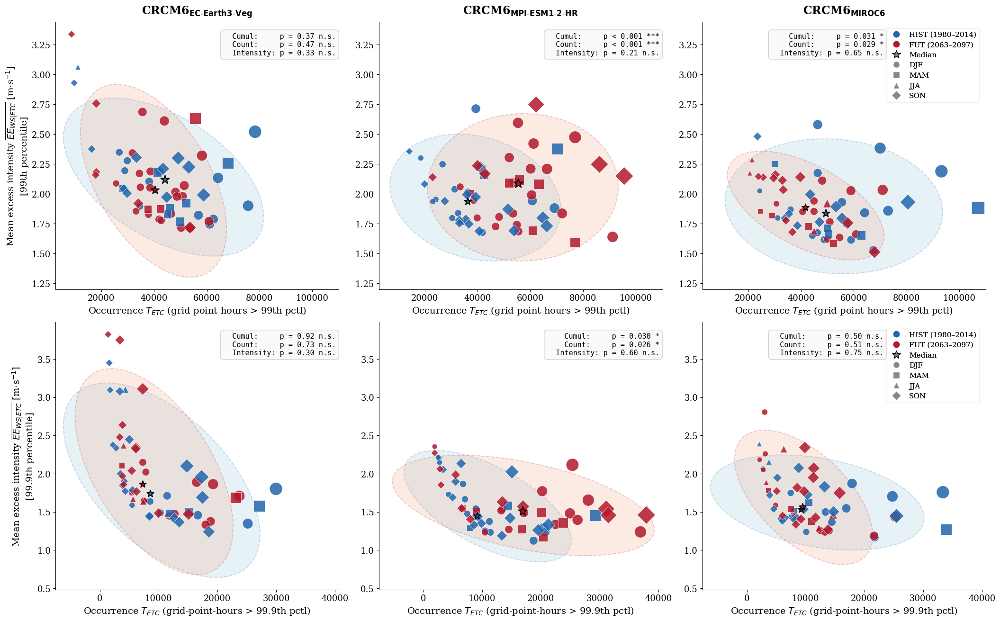

In [9]:
fig = plot_top_scatter('wind', 'm·s$^{-1}$', select_by='intensity', variable_marker_size=True, lambda_={99: 10000, 999: 2500})
plt.show()
# fig.savefig(f'{base}/ALL/PLOT/scatter_top{N_TOP}_storms_intensity_WS.png', dpi=200, bbox_inches='tight')

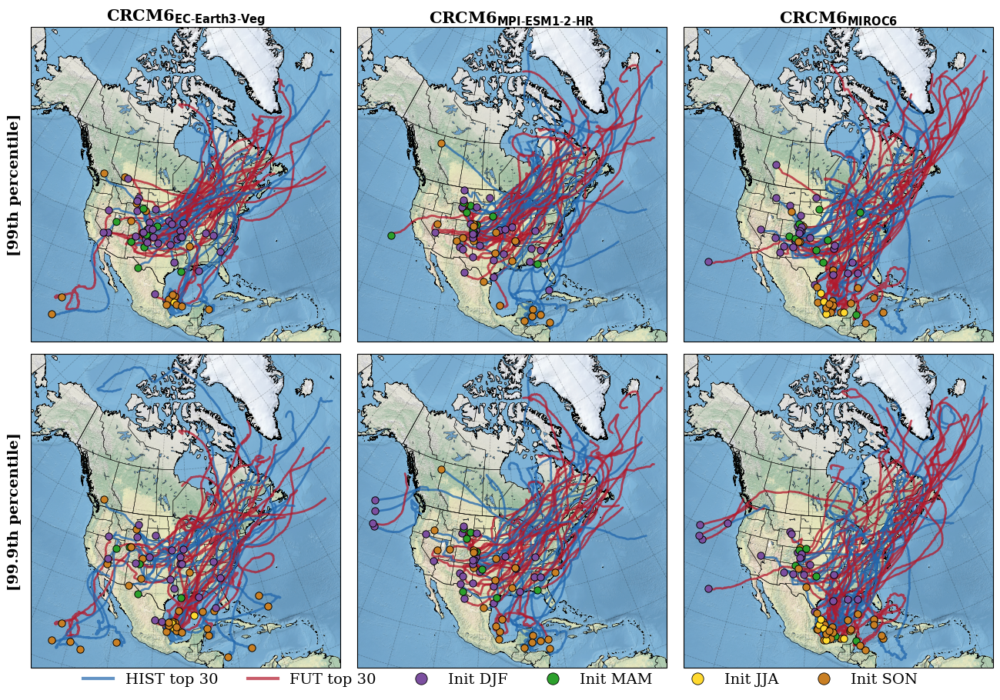

In [10]:
fig = plot_top_trajectories('wind', 'm·s$^{-1}$', select_by='intensity', lambda_={99: 10000, 999: 2500})
plt.show()
fig.savefig(f'{base}/ALL/PLOT/supp_tracks_top{N_TOP}_storms_intensity_WS.png', dpi=200, bbox_inches='tight')

## Top-N storms ranked by mean excess intensity

A third view: after selecting the top-N storms by regularized intensity, we sort
them by their raw mean excess $\overline{EE_V}$ and plot intensity vs rank
(1 = most intense). The HIST and FUT curves make the **upper-tail shift** visible
directly: where the FUT curve lies above HIST (shaded red), future extremes are
stronger at that rank; the opposite is shaded blue. A clear gap at the top ranks
(left-hand side) is the climate-change signal on the most violent storms.

Marker shape still encodes initiation season, and the per-panel stats box reports
the Mann-Whitney U test on the intensity distribution of the top-N storms, plus
the median change (%) between HIST and FUT.

### Precipitation

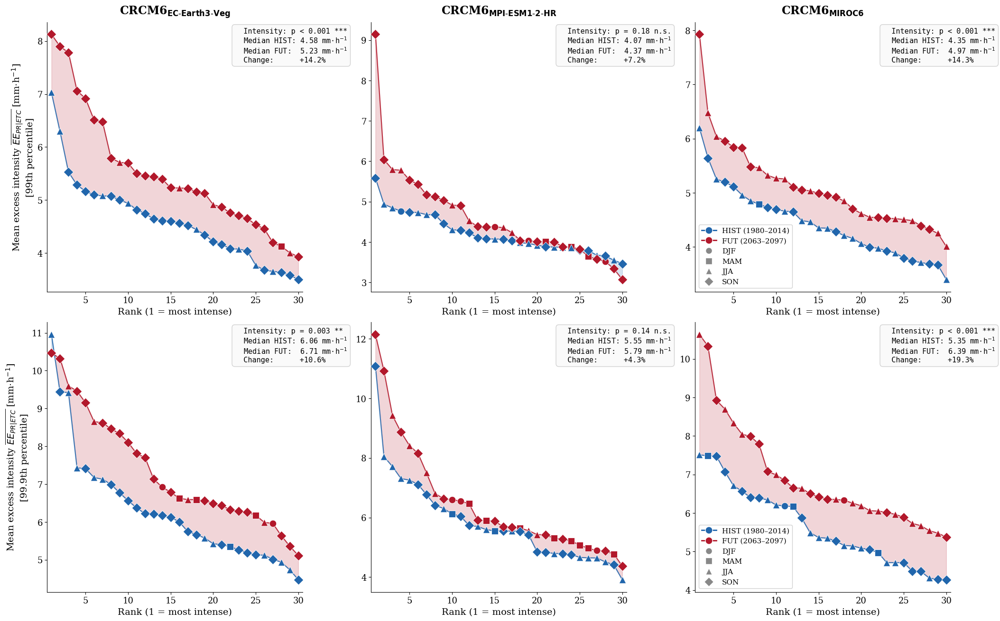

In [14]:
def plot_top_intensity_ranks(metric_var, units, lambda_=LAMBDA, top_storms=N_TOP):
    """Sorted intensity vs rank for the top-N storms selected by regularized intensity
    I_reg = mean_excess * n / (n + lam). 2 rows (99th, 99.9th) x 3 cols (pairs).

    Parameters
    ----------
    metric_var : {'pr', 'wind'}
    units : str
        Units of mean excess intensity, shown on the y-axis.
    lambda_ : float
        Regularization strength for the selection metric I_reg.
    top_storms : int
        Number of storms kept per (simulation, percentile) panel.

    The legend is drawn only in the right-most column of each row (one legend per
    percentile) to avoid repeating it six times across the figure.
    """
    int_col = f'mean_excess_{metric_var}'

    fig, axes = plt.subplots(2, 3, figsize=(21, 13), constrained_layout=True)

    for row, pct in enumerate(PERCENTILES):
        lam = _resolve_lambda(lambda_, pct)
        ireg_col = f'ireg_{metric_var}_lam{lam}'
        for col, (hist, fut) in enumerate(pairs):
            ax = axes[row, col]

            df_h_all = add_regularized_intensity(data_pct[pct][hist], metric_var, lam)
            df_f_all = add_regularized_intensity(data_pct[pct][fut], metric_var, lam)

            df_hist = df_h_all.nlargest(top_storms, ireg_col).sort_values(int_col, ascending=False).reset_index(drop=True)
            df_fut = df_f_all.nlargest(top_storms, ireg_col).sort_values(int_col, ascending=False).reset_index(drop=True)

            n = min(len(df_hist), len(df_fut))
            df_hist = df_hist.iloc[:n]
            df_fut = df_fut.iloc[:n]
            ranks = np.arange(1, n + 1)

            ax.fill_between(ranks, df_hist[int_col], df_fut[int_col],
                             where=(df_fut[int_col].values >= df_hist[int_col].values),
                             interpolate=True, color=C_FUT, alpha=0.18, label='FUT > HIST')
            ax.fill_between(ranks, df_hist[int_col], df_fut[int_col],
                             where=(df_fut[int_col].values < df_hist[int_col].values),
                             interpolate=True, color=C_HIST, alpha=0.18, label='HIST > FUT')

            ax.plot(ranks, df_hist[int_col], color=C_HIST, linewidth=1.6, alpha=0.85, zorder=3)
            ax.plot(ranks, df_fut[int_col], color=C_FUT, linewidth=1.6, alpha=0.85, zorder=3)

            for season, marker in SEASON_MARKER.items():
                mh = df_hist['season'].values == season
                mf = df_fut['season'].values == season
                if mh.any():
                    ax.scatter(ranks[mh], df_hist[int_col].values[mh], marker=marker,
                               color=C_HIST, edgecolors='white', linewidths=0.6, s=110, zorder=4)
                if mf.any():
                    ax.scatter(ranks[mf], df_fut[int_col].values[mf], marker=marker,
                               color=C_FUT, edgecolors='white', linewidths=0.6, s=110, zorder=4)

            _, p_int = stats.mannwhitneyu(df_hist[int_col], df_fut[int_col], alternative='two-sided')
            med_h = df_hist[int_col].median()
            med_f = df_fut[int_col].median()
            change = (med_f - med_h) / med_h * 100 if med_h != 0 else np.nan

            textstr = (f'  Intensity: {format_pval(p_int)} {significance_stars(p_int)}\n'
                       f'  Median HIST: {med_h:.2f} {units}\n'
                       f'  Median FUT:  {med_f:.2f} {units}\n'
                       f'  Change:      {change:+.1f}%')
            ax.text(0.735, 0.98, textstr, transform=ax.transAxes, fontsize=11,
                    verticalalignment='top', fontfamily='monospace',
                    bbox=dict(boxstyle='round,pad=0.4', facecolor='#fafafa',
                              edgecolor='#cccccc', alpha=0.9))

            ax.tick_params(axis='both', labelsize=13)
            ax.set_xlabel('Rank (1 = most intense)', fontsize=14)
            if col == 0:
                var_math = 'PR' if metric_var == 'pr' else 'WS'
                ax.set_ylabel(rf'Mean excess intensity $\overline{{EE_{{{var_math}|ETC}}}}$ [{units}]' + '\n'
                              f'[{PCT_LABEL[pct]} percentile]', fontsize=14)
            if row == 0:
                ax.set_title(sim_label[hist], fontsize=17, fontweight='bold', pad=12)
            ax.set_xlim(0.5, top_storms + 0.5)

            # Legend only in the right-most column (one per row / percentile)
            if col == len(pairs) - 1:
                legend_handles = [
                    Line2D([0], [0], marker='o', color=C_HIST, markerfacecolor=C_HIST,
                           markeredgecolor='white', markersize=11, linewidth=2, label='HIST (1980–2014)'),
                    Line2D([0], [0], marker='o', color=C_FUT, markerfacecolor=C_FUT,
                           markeredgecolor='white', markersize=11, linewidth=2, label='FUT (2063–2097)'),
                ]
                for season, marker in SEASON_MARKER.items():
                    legend_handles.append(
                        Line2D([0], [0], marker=marker, color='w', markerfacecolor='#888',
                               markeredgecolor='white', markersize=10, label=season)
                    )
                ax.legend(handles=legend_handles, fontsize=11, loc='lower left',
                          framealpha=0.9, edgecolor='#cccccc')

    var_math = 'PR' if metric_var == 'pr' else 'WS'
    if isinstance(lambda_, dict):
        lam_txt = ', '.join(f'{PCT_LABEL[p]}: {lambda_[p]}' for p in PERCENTILES)
    else:
        lam_txt = str(lambda_)
    # fig.suptitle(rf'Top {top_storms} most intense storms (selected by '
    #              rf'$\overline{{EE_{{{var_math}|ETC}}}} \cdot T_{{ETC}}/(T_{{ETC}}+\lambda)$, '
    #              rf'$\lambda$ = {lam_txt}) — '
    #              f'{("precipitation" if metric_var=="pr" else "wind")} mean excess',
    #              fontsize=14, y=1.03)
    return fig


fig = plot_top_intensity_ranks('pr', 'mm·h$^{-1}$', lambda_={99: 5000, 999: 1250})
plt.show()
fig.savefig(f'{base}/ALL/PLOT/rank_top{N_TOP}_intensity_PR.png', dpi=200, bbox_inches='tight')

### Wind

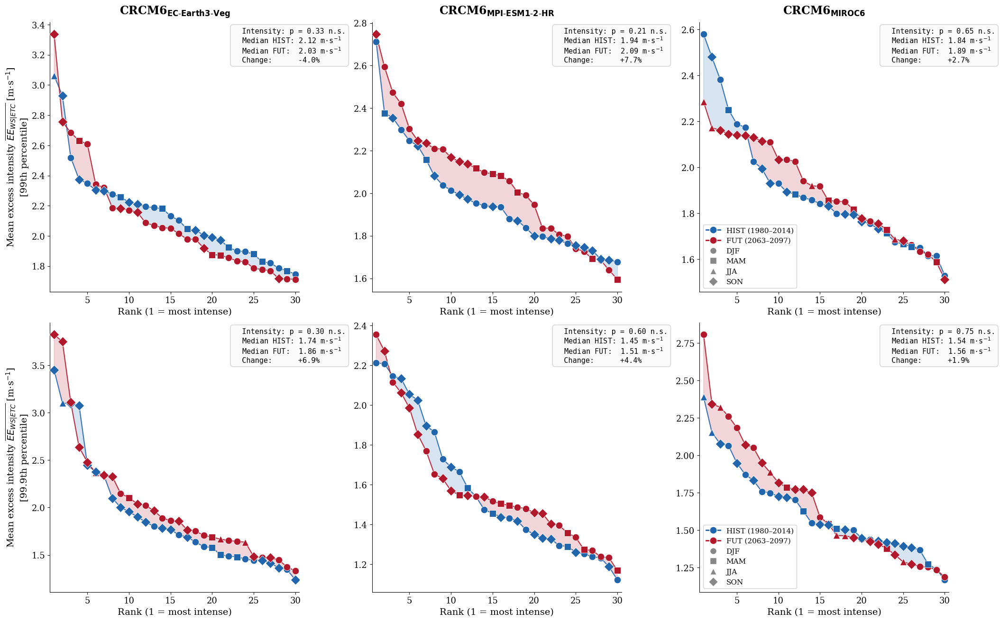

In [16]:
fig = plot_top_intensity_ranks('wind', 'm·s$^{-1}$', lambda_={99: 10000, 999: 2500})
plt.show()
fig.savefig(f'{base}/ALL/PLOT/rank_top{N_TOP}_intensity_WS.png', dpi=200, bbox_inches='tight')

## Summary: statistical tests on the full storm population (99.9th percentile)

Unlike the figures above, which restrict attention to the top-N most extreme storms,
this table summarises the HIST-vs-FUT distributional differences across **all storms
with non-zero exceedance** for each GCM pair and each metric. Two complementary tests
are reported:

- **Mann-Whitney U** (MW-U): non-parametric test of whether one distribution is
  stochastically greater than the other. Makes no normality assumption.
- **Kolmogorov-Smirnov** (KS): tests whether two samples come from the same
  continuous distribution (sensitive to both location and shape shifts).

For each row, we also report the median in HIST and FUT, and the median change (%),
to make the *direction* and *magnitude* of the shift readable at a glance. Significance
levels: `***` p<0.001, `**` p<0.01, `*` p<0.05, `n.s.` not significant.

In [13]:
metrics_all = [
    ('cum_excess_pr', 'Precip cumul'),
    ('count_exceed_pr', 'Precip count'),
    ('mean_excess_pr', 'Precip intensity'),
    ('cum_excess_wind', 'Wind cumul'),
    ('count_exceed_wind', 'Wind count'),
    ('mean_excess_wind', 'Wind intensity'),
]

rows = []
for hist, fut in pairs:
    for metric, label in metrics_all:
        var = 'pr' if 'pr' in metric else 'wind'
        cum_col = f'cum_excess_{var}'

        h = data[hist].dropna(subset=[metric])
        f = data[fut].dropna(subset=[metric])
        h = h[h[cum_col] > 0][metric]
        f = f[f[cum_col] > 0][metric]

        mw_stat, mw_p = stats.mannwhitneyu(h, f, alternative='two-sided')
        ks_stat, ks_p = stats.ks_2samp(h, f)

        rows.append({
            'GCM': sim_name[hist],
            'Metric': label,
            'Median hist': f'{h.median():.2f}',
            'Median fut': f'{f.median():.2f}',
            'Change (%)': f'{((f.median() - h.median()) / h.median()) * 100:+.1f}' if h.median() != 0 else 'N/A',
            'MW-U p': format_pval(mw_p),
            'MW-U': significance_stars(mw_p),
            'KS p': format_pval(ks_p),
            'KS': significance_stars(ks_p),
            'N hist': len(h),
            'N fut': len(f),
        })

df_stats = pd.DataFrame(rows)
df_stats

,GCM,Metric,Median hist,Median fut,Change (%),MW-U p,MW-U,KS p,KS,N hist,N fut
0,CRCM6 (EC-Earth3-Veg),Precip cumul,57.86,59.49,+2.8,p = 0.07,n.s.,p = 0.025,*,5034,4966
1,CRCM6 (EC-Earth3-Veg),Precip count,37.00,35.00,-5.4,p = 0.40,n.s.,p = 0.06,n.s.,5034,4966
2,CRCM6 (EC-Earth3-Veg),Precip intensity,1.55,1.63,+5.4,p < 0.001,***,p < 0.001,***,5034,4966
3,CRCM6 (EC-Earth3-Veg),Wind cumul,22.57,24.52,+8.6,p = 0.15,n.s.,p = 0.51,n.s.,3974,3563
4,CRCM6 (EC-Earth3-Veg),Wind count,34.50,37.00,+7.2,p = 0.037,*,p = 0.036,*,3974,3563
5,CRCM6 (EC-Earth3-Veg),Wind intensity,0.65,0.66,+1.3,p = 0.98,n.s.,p = 0.17,n.s.,3974,3563
6,CRCM6 (MPI-ESM1-2-HR),Precip cumul,52.18,64.40,+23.4,p < 0.001,***,p = 0.001,**,4941,5011
7,CRCM6 (MPI-ESM1-2-HR),Precip count,38.00,42.00,+10.5,p < 0.001,***,p = 0.005,**,4941,5011
8,CRCM6 (MPI-ESM1-2-HR),Precip intensity,1.38,1.51,+8.9,p < 0.001,***,p < 0.001,***,4941,5011
9,CRCM6 (MPI-ESM1-2-HR),Wind cumul,23.19,24.30,+4.8,p = 0.86,n.s.,p = 0.40,n.s.,4024,3784
